<a href="https://colab.research.google.com/github/Kim030823/MMRES_assignments/blob/main/nbs/homeworks/03_generative.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 3 - Generative models
> The goal of this homework is to become familiar with the common practice of using pre-trained models.

<a href="https://githubtocolab.com/BorjaRequena/Neural-Network-Course/blob/master/nbs/homeworks/03_generative.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open in Colab"/></a>

In our session about typical machine learning applications, we saw a bunch of prototypical tasks on various fields. A prominent example was generating images from a given description we wrote. This is possible thanks to the latest advances in generative models: stable diffusion, the current state-of-the-art text to image model.

In this homework, we will download a pre-trained stable diffusion model and we will have a bit of fun with it! However, we will not dive into the details or inner workings of stable diffusion, as they are far beyond the level we have covered in the course so far. The goal of this homework is to become familiar with the process of downloading a pre-trained model, follow a tutorial and troubleshoot any potential issues we may encounter (send your questions by email to Borja). All while having some fun!

The first part of the homework will focus on becoming familiar with the library that we will use to perform the tasks. To do so, we will adapt part of the [tutorial in the fastai course](https://github.com/fastai/diffusion-nbs/blob/master/stable_diffusion.ipynb) by Pedro Cuenca, Patrick von Platen, Suraj Patil and Jeremy Howard, which uses the 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers) to download and use diffusion models.

Then, we describe the tasks to conduct to write your report, which are related to the introductory part.

In [1]:
#| hide
# Uncomment and run this cell in colab
!pip install -Uq diffusers transformers fastcore

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 4.4 MB/s eta 0:00:00


# 0 - Introduction to use stable diffusion

In order to do the tasks in this homework, we first need to learn how to use the models.

To run stable diffusion on your computer you have to accept the model license. It's an open CreativeML OpenRail-M license that claims no rights on the outputs you generate and prohibits you from deliberately producing illegal or harmful content. The [model card](https://huggingface.co/CompVis/stable-diffusion-v1-4) provides more details. If you do accept the license, you need to be a registered user in 🤗 Hugging Face Hub and use an access token for the code to work. You have two options to provide your access token:

* Use the `huggingface-cli login` command-line tool in your terminal and paste your token when prompted. It will be saved in a file in your computer.
* Or use `notebook_login()` in a notebook, which does the same thing.

In [2]:
#| hide
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

## Stable Diffusion Pipeline
[`StableDiffusionPipeline`](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion#diffusers.StableDiffusionPipeline) is an end-to-end [diffusion inference pipeline](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion) that allows us to generate images with just a few lines of code. Many Hugging Face libraries (along with others like scikit-learn) use the concept of a "pipeline" to indicate a sequence of steps that achieve a task when combined.

::: {.callout-tip}
## Implementation details

We use [`from_pretrained`](https://huggingface.co/docs/diffusers/main/en/api/diffusion_pipeline#diffusers.DiffusionPipeline.from_pretrained) to create the pipeline and download the pretrained weights. We indicate that we want to use the `fp16` (half-precision) version of the weights, and we tell `diffusers` to expect the weights in that format. This allows us to perform much faster inference with almost no discernible difference in quality. The string passed to `from_pretrained` in this case (`CompVis/stable-diffusion-v1-4`) is the repo id of a pretrained pipeline hosted on [Hugging Face Hub](https://huggingface.co/models); it can also be a path to a directory containing pipeline weights. The weights for all the models in the pipeline will be downloaded and cached the first time you run this cell.
:::

Let's create our pipeline!

In [3]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16).to("cuda")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/543 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/pipeline_loading_utils.py:333: FutureWarning: You are loading the variant fp16 from CompVis/stable-diffusion-v1-4 via `revision='fp16'`. This behavior is deprecated and will be removed in diffusers v1. One should use `variant='fp16'` instead. However, it appears that CompVis/stable-diffusion-v1-4 currently does not have the required variant filenames in the 'main' branch. 
 The Diffusers team and community would be very grateful if you could open an issue: https://github.com/huggingface/diffusers/issues/new with the title 'CompVis/stable-diffusion-v1-4 is missing fp16 files' so that the correct variant file can be added.
  warnings.warn(


Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

text_encoder/pytorch_model.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

safety_checker/pytorch_model.bin:   0%|          | 0.00/608M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/572 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/307 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/788 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/772 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/550 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.bin:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/unet.
/usr/local/lib/python3.12/dist-packages/transformers/models/clip/feature_extraction_clip.py:30: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/vae.


::: {.callout-note}
If your GPU is not big enough to use `pipe`, run `pipe.enable_attention_slicing()` in the cell right below.  
As described in the docs: "When this option is enabled, the attention module will split the input tensor in slices, to compute attention in several steps. This is useful to save some memory in exchange for a small speed decrease."
:::

In [ ]:
#pipe.enable_attention_slicing()

Now that we have a working pipeline, let's generate some images. As we saw in class, we need to provide this model with a description of the image that we want to generate.

In [4]:
prompt = "a photograph of an astronaut riding a horse"

  0%|          | 0/50 [00:00<?, ?it/s]

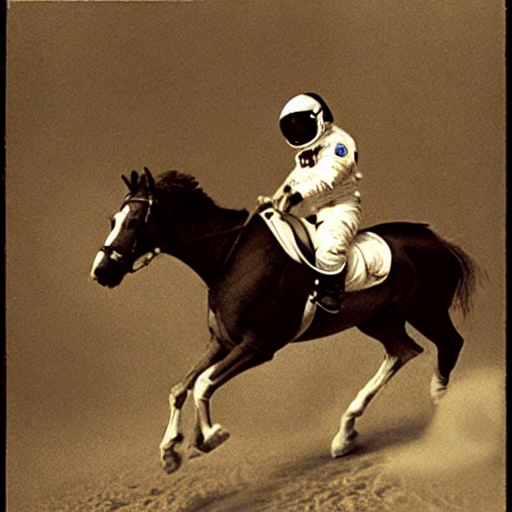

In [5]:
#| code-fold:true
images = pipe(prompt).images
images[0]

::: {.callout-note}
These models are stochastic, so every time we execute the code with the same prompt, we will obtain a different image (try executing the cell above again!). We can fix the result by providing a manual seed for the random number genertor in pytorch with `torch.manual_seed()`, as we do below. This allows us to consistently see the effect of the parameters on the output.
:::

  0%|          | 0/50 [00:00<?, ?it/s]

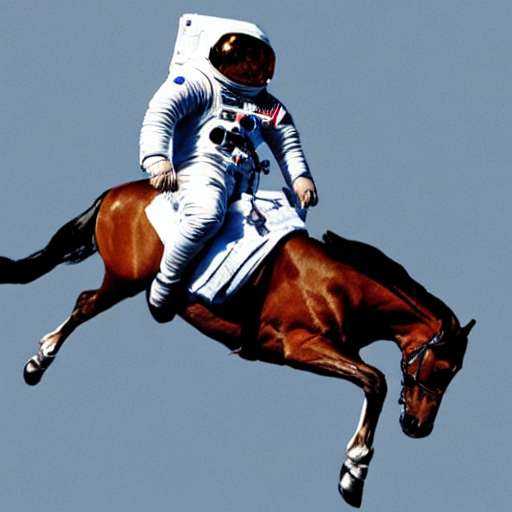

In [6]:
#| code-fold: true
torch.manual_seed(1024)
pipe(prompt).images[0]

Running the pipeline shows a progress bar with a certain number of steps. This is because Stable Diffusion is based on a progressive denoising algorithm that is able to create convincing images from pure random noise. Models in this family are known as _diffusion models_. Here, we show an example of the process starting from random noise at top, to progressively improved images towards the bottom, of a model that creates handwritten digits.

![image.png](attachment:image.png)

We can change the number of denoising steps in a trade-off between faster predictions and image quality. Let's see what happens when we try to generate the image from above with only 3 and 16 steps.

  0%|          | 0/3 [00:00<?, ?it/s]

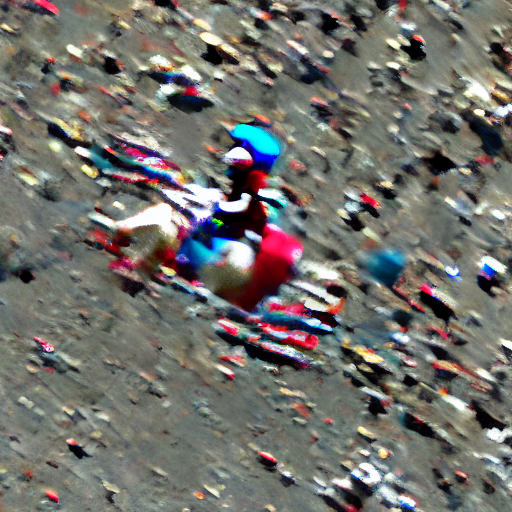

In [7]:
#| code-fold: true
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=3).images[0]

  0%|          | 0/16 [00:00<?, ?it/s]

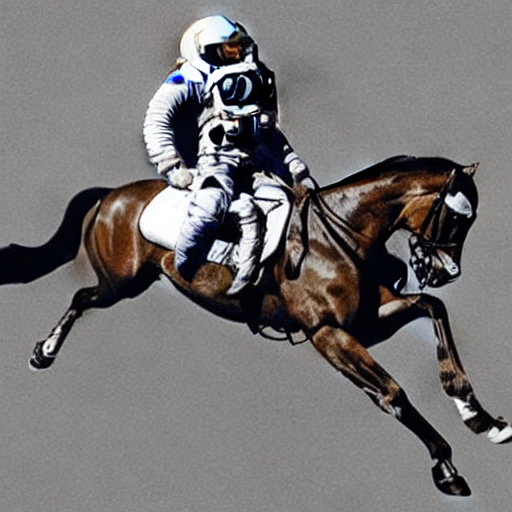

In [8]:
#| code-fold: true
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=16).images[0]

## Classifier-Free Guidance

In [9]:
#| hide
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

_Classifier-Free Guidance_ is a method to increase the adherence of the output to the conditioning signal we used (the text).

Roughly speaking, the larger the guidance the more the model tries to represent the text prompt. However, large values tend to produce less diversity. The default is `7.5`, which represents a good compromise between variety and fidelity. This [blog post](https://benanne.github.io/2022/05/26/guidance.html) goes into deeper details on how it works.

We can generate multiple images for the same prompt by simply passing a list of prompts instead of a string.

In [10]:
num_rows, num_cols = 4, 4
prompts = [prompt] * num_cols
guidances = [1.1, 3, 7, 14]

In [11]:
images = concat(pipe(prompts, guidance_scale=g).images for g in guidances)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

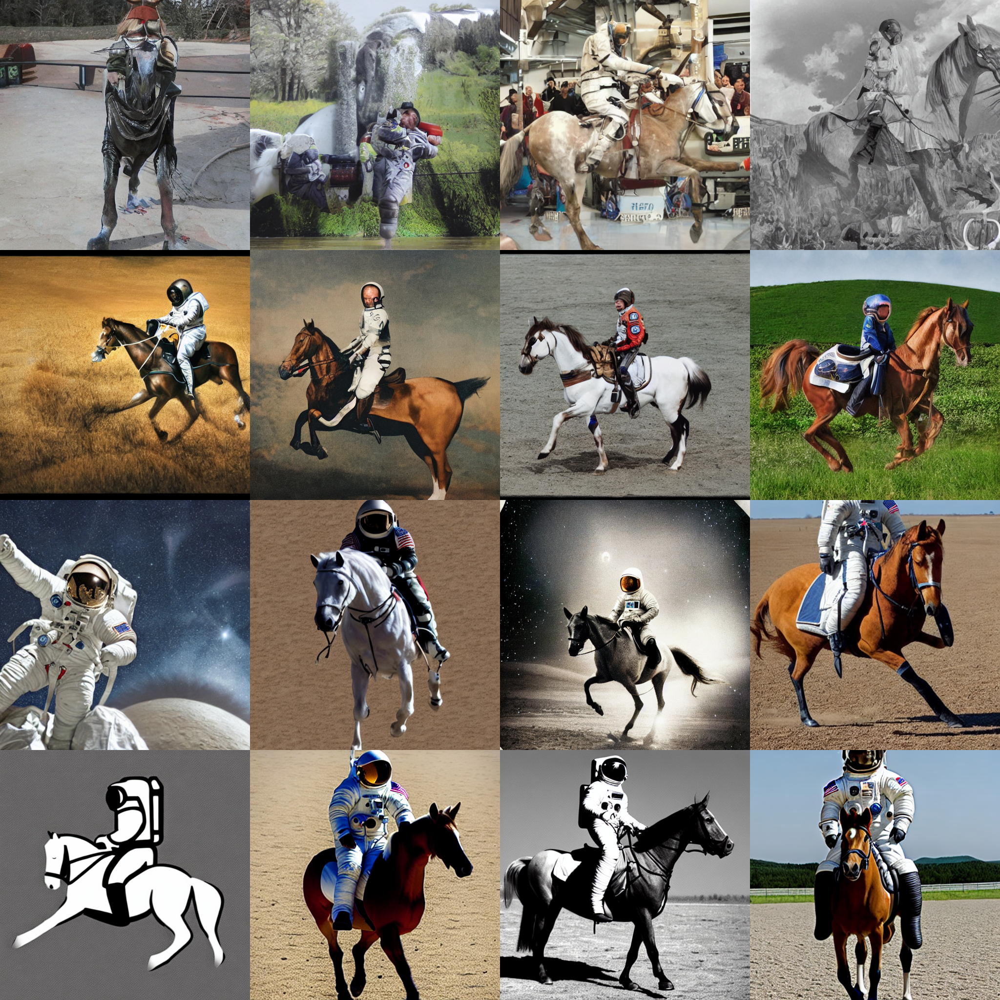

In [ ]:
#| code-fold: true
image_grid(images, rows=num_rows, cols=num_cols)

## Negative prompts
_Negative prompting_ refers to the use a second prompt to increase the difference between generations of the original prompt and the second one.

In [12]:
prompt = "Labrador in the style of Vermeer"

  0%|          | 0/50 [00:00<?, ?it/s]

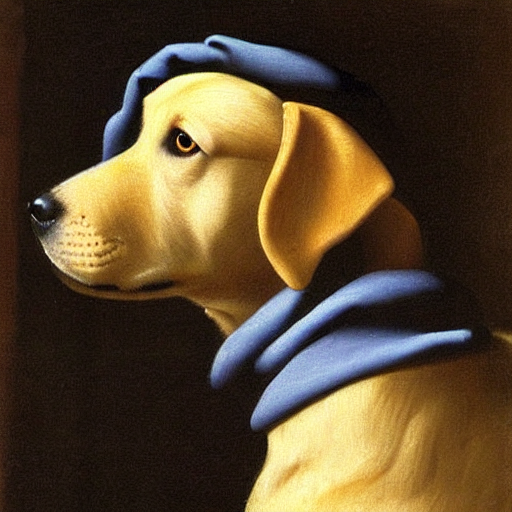

In [14]:
#| code-fold: true
torch.manual_seed(1000)
pipe(prompt).images[0]

In [15]:
neg_prompt = "blue"

  0%|          | 0/50 [00:00<?, ?it/s]

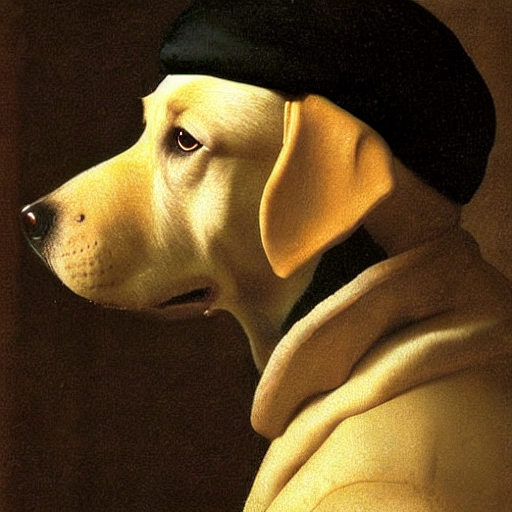

In [16]:
#| code-fold: true
torch.manual_seed(1000)
pipe(prompt, negative_prompt=neg_prompt).images[0]

With the negative prompt, we move more towards the direction of the positive one reducing the importance of the negative prompt in our composition. Here, we see how the blue scarf has disappeared from the image.

## Image to Image
Even though Stable Diffusion was trained to generate images, and optionally drive the generation using text conditioning, we can use the raw image diffusion process for other tasks.

For example, instead of starting from pure noise, we can start from an image an add a certain amount of noise to it. This way, we skip the initial steps of the denoising process and pretend our noisy image is what the algorithm came up with from the raw noise. Then we continue the diffusion process from that state as usual. This usually preserves the composition, although the details may change significantly. This process works wonders with sketches!

::: {.callout-tip}
## Implementation details
We can do these operations with a special image to image pipeline: `StableDiffusionImg2ImgPipeline`. This is the source code for its [`__call__` method](https://github.com/huggingface/diffusers/blob/main/src/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py#L471), which takes an initial image, adds some noise to it and runs the diffusion process from there.
:::

In [17]:
#| hide
from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload

In [18]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision="fp16",
    torch_dtype=torch.float16,
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/unet.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/vae.


As an example, we can use the sketch created by [VigilanteRogue81](https://huggingface.co/spaces/huggingface-projects/diffuse-the-rest/discussions/204).

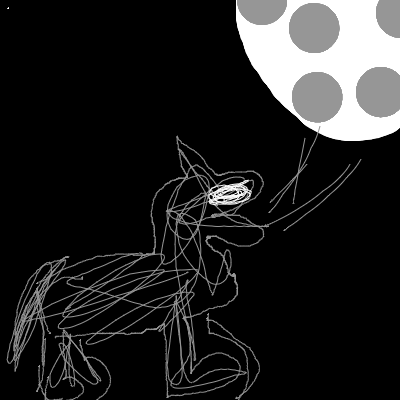

In [19]:
#| code-fold: true
# p = FastDownload().download('https://s3.amazonaws.com/moonup/production/uploads/1664665907257-noauth.png')
p = FastDownload().download('https://cdn-uploads.huggingface.co/production/uploads/1664665907257-noauth.png')
init_image = Image.open(p).convert("RGB")
init_image

Now let's create some images starting from the sketch.

In [20]:
prompt = "Wolf howling at the moon, photorealistic 4K"

/usr/local/lib/python3.12/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:781: FutureWarning: You have passed 3 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/40 [00:00<?, ?it/s]

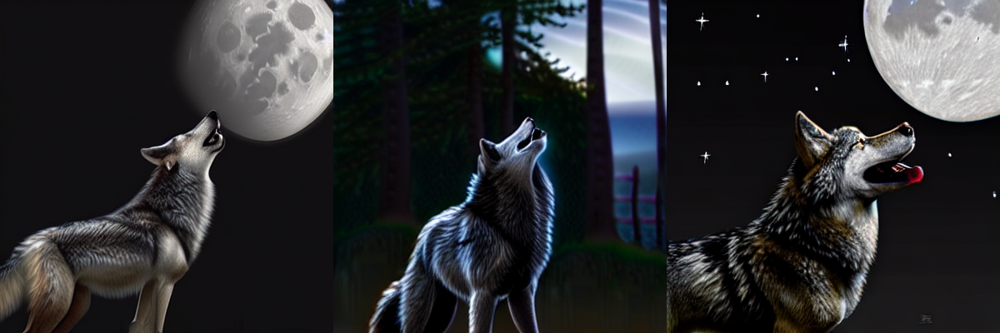

In [21]:
#| code-fold: true
torch.manual_seed(1000)
images = pipe(prompt=prompt, num_images_per_prompt=3, image=init_image, strength=0.8, num_inference_steps=50).images
image_grid(images, rows=1, cols=3)

When we get a composition we like we can use it as the next seed for another prompt and further change the results. For example, let's take the third image above and try to use it to generate something in the style of Van Gogh.

In [22]:
prompt = "Oil painting of wolf howling at the moon by Van Gogh"
init_image = images[2]

  0%|          | 0/70 [00:00<?, ?it/s]

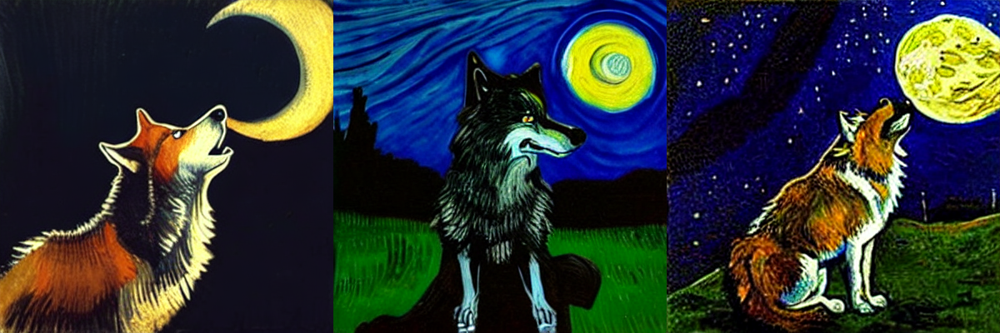

In [24]:
#| code-fold: true
torch.manual_seed(1000)
images = pipe(prompt=prompt, num_images_per_prompt=3, image=init_image, strength=1, num_inference_steps=70).images
image_grid(images, rows=1, cols=3)

Creative people use different tools in a process of iterative refinement to come up with the ideas they have in mind. Here's a [list with some suggestions](https://github.com/fastai/diffusion-nbs/blob/43a090286e5742f807d4ff58524c02a1888b3004/suggested_tools.md) to get started.

# 1 - Stable diffusion

Now that we know how to use the model, we can proceed to experiment with it and study some of its most basic properties. Write a report detailing the results and conclusions drawn by completing the following tasks.

## 1.1 - Basic stable diffusion

We start by experimenting with the basic model. Come up with a prompt and generate various images for it (have some fun!). Show three representative images and comment on the general behaviour of the model and trends that you may observe. For instance, comment on whether it can consistently account for all the aspects in your prompt or whether it struggles to include some of those. Do all images have the same composition or do you observe significant changes in the layouts?

## 1.2 - Messing with the inference process

Experiment with the inference process. Define a prompt (could be the same as before) and fix a random seed with `torch.manual_seed`, as we show in the introductory part to always obtain the same outcome for the same prompt. Generate images with a different number of inference steps: 3, 15, 50, and as much as you can go in a reasonable time (higher than 60).  Do so by appropiately setting `num_inference_steps`. Show the resulting images and describe what you observe qualitatively. In what sense do the images improve as we increase the number of steps?

::: {.callout-tip}
In the astronaut riding a horse above, we see that with very few steps the model cannot generate a coherent image. Increasing the number of steps, the image starts to shape up according to our prompt but it struggles with some basic physical properties, such as the horse legs (it has only three and one of them has a ghost hoof). If we increase the number of steps further, these errors disappear and we obtain the first image.
:::

# 2 - Advanced parameters

Now that we have a qualitative understanding of stable diffusion. Let's play with some more advanced aspects. For now, you do not need to fully understand them. If you are interested, we can dive deeper in the last lesson of our course.

## 2.1 - Classifier-free guidance

In the introductory part above, we have seen how to tune our method's adherance to our description. Define a prompt and a random seed. Generate images for four guidance values 1.1, 3.5, 7 and 14. Comment on the general behaviour.

## 2.2 - Negative prompts

Repeat the exact same process from 2.1 but, this time, include an appropiate negative prompt for our image generation (keep the original prompt and seed). How does the guidance impact the effect of the negative prompt?

::: {.callout-tip}
Use the results from the best images to define an appropiate negative prompt.
:::

# 3 - Image to image

Choose one of the following image to image tasks:

## (a) Starting from a sketch
Draw a sketch (e.g. in paint), save it in png format and use it to generate a few cool images. Show the sketch and a few representative examples of the resulting images. Comment on the model's behaviour, which parts of the sketch are preserved or discarded (composition? colors?) and what they have become.

## (b) Starting from an image
Generate an image with the diffusion model and use it as starting point to generate new images. Show the initial image and a few representative examples of the resulting ones. Comment on the model's behaviour, which parts of the image have been preserved (composition? colors?) and what they have become.